Розширення межі вимірювання мікроамперметра

Формула для розрахунку різниці потенціалів для зашунтованного амперметру

$U_{AB} = J_{a} R_{a} = J_{shunt} R_{shunt} = J \frac{R_a R_{shunt}}{R_a + R_{shunt}}$

звідки

$J = J_a \frac{R_a + R_{shunt}}{R_{shunt}} = J_a \left( \frac{R_a}{R_{shunt}} + 1 \right) = J_a P$

величина $P = J / J_a$ яка показує, в скілки разів збільшується межа вимірювання струмового приладу, називається шунтуючим множником. Очевидно

$P = \left( \frac{R_a}{R_{shunt}} + 1 \right)$

$R_{shunt} = \frac{R_a}{P-1}$

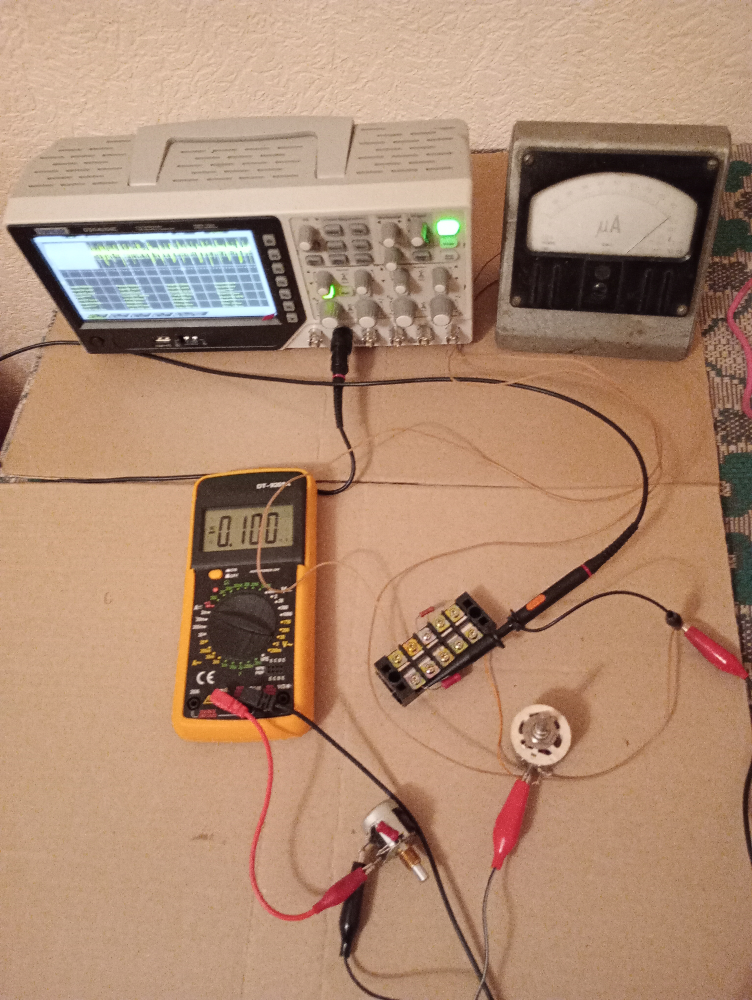

In [1]:
mjuA_mjuA_mV = [
    [66, 61, 40.29],
    [66, 61, 40.63],
    [66, 61, 40.56],

    [49, 46, 30.28],
    [49, 46, 30.24],
    [49, 46, 30.29],
    [49, 46, 30.36],

    [53, 50, 32.95],
    [53, 50, 33.01],
    [53, 50, 33.00],
    [53, 50, 33.07],

    [75, 70, 47.00],
    [75, 70, 46.92],
    [75, 70, 46.91],
    [75, 70, 46.84],

    [96, 90, 60.91],
    [96, 90, 60.35],
    [96, 90, 60.26],

    [100, 94, 62.8],
    [100, 94, 63.23],

    [85, 80, 53.29],
    [85, 80, 53.27],
    [85, 80, 53.52],
    
    [64, 60, 39.78],
    [64, 60, 39.51],
    [64, 60, 39.58],
]

In [2]:
mjuA_digital_mV = [(0,0)]
mjuA_analog_mV = [(0,0)]
for (mjuA_digital, mjuA_analog, mV) in mjuA_mjuA_mV:
    mjuA_digital_mV += [(mjuA_digital, mV)]
    mjuA_analog_mV += [(mjuA_analog, mV)]

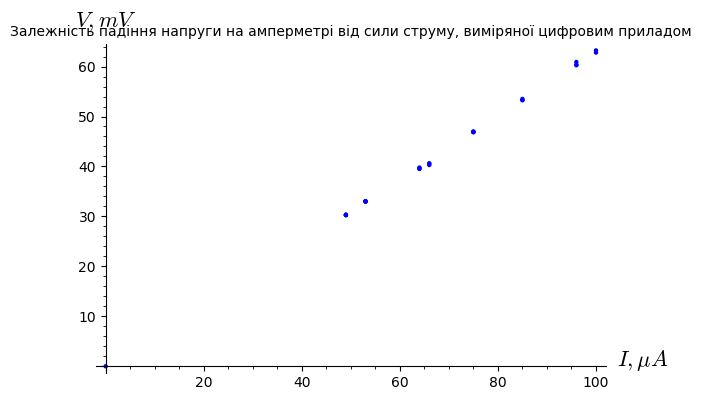

In [3]:
plt_digital_Ampermeter = list_plot(mjuA_digital_mV)
plt_digital_Ampermeter.show(axes_labels=['$I, \\mu A$','$V, mV$'],
                            title="Залежність падіння напруги на амперметрі від сили струму, виміряної цифровим приладом")

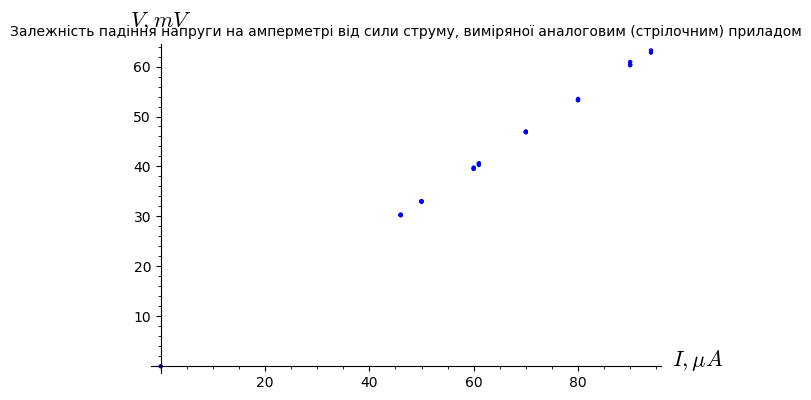

In [4]:
plt_analog_Ampermeter = list_plot(mjuA_analog_mV)
plt_analog_Ampermeter.show(axes_labels=['$I, \\mu A$','$V, mV$'],
                           title="Залежність падіння напруги на амперметрі від сили струму, виміряної аналоговим (стрілочним) приладом")

In [26]:
# Linear approximation
def linear_approximation(A_mV, ed_izm):
    import common as cm
    # build error function
    r, v = var("r, v")
    errors = 0
    for (A, mV) in A_mV:
        errors += (r*A + v - mV)^2
    errors = errors.expand()
    cm.displ("Error =" + latex(errors))

    # Derivatives of error function
    cm.displ("\\frac{\\partial Error}{\\partial r} =" + latex(diff(errors, r)))
    cm.displ("\\frac{\\partial Error}{\\partial v} =" + latex(diff(errors, v)))
    # set derivatives of error function equial to zero
    equations = [diff(errors, r) == 0, diff(errors, v) == 0]
    cm.disp(equations)
    # solve obtained equations, and find a, b
    solution_rv = solve(equations, [r,v])[0]
    cm.disp(solution_rv)
    R = solution_rv[0].rhs().n()
    V = solution_rv[1].rhs().n()
    cm.displ("R = " + '{:8.5f}'.format(R) + ed_izm)
    cm.displ("V = " + '{:6.3f}'.format(V) + "\\,mV")

    # Стандартне відхилення
    nevjazka = errors.subs([r == R, v == V])
    print("nevjazka =", nevjazka)
    vidhilennja = sqrt(nevjazka/(len(A_mV) - 1))
    print("vidhilennja =", vidhilennja)
    return R, V

In [27]:
R_Ampermeter_digital_kOhm, V_digital_Ampermeter = linear_approximation(mjuA_digital_mV, "\\,k\\Omega")

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

nevjazka = 3.14649398513575
vidhilennja = 0.347877851304589


In [28]:
R_Ampermeter_analog_kOhm, V_analog_Ampermeter = linear_approximation(mjuA_analog_mV, "\\,k\\Omega")

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

nevjazka = 1.94313778054493
vidhilennja = 0.273378983249439


In [29]:
iA = var("iA")
R_Ampermeter_digital_approximation = R_Ampermeter_digital_kOhm * iA + V_digital_Ampermeter
R_Ampermeter_analog_approximation  = R_Ampermeter_analog_kOhm  * iA + V_analog_Ampermeter

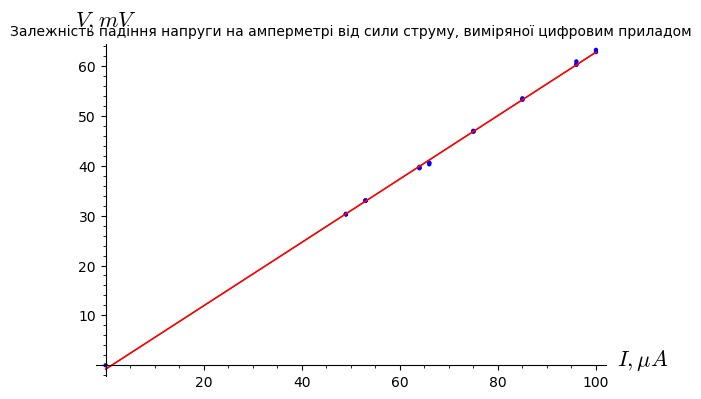

In [30]:
plt_digital_Ampermeter += plot(R_Ampermeter_digital_approximation, iA, 0, 100, color = "red")
plt_digital_Ampermeter.show(axes_labels=['$I, \\mu A$','$V, mV$'],
                           title="Залежність падіння напруги на амперметрі від сили струму, виміряної цифровим приладом")

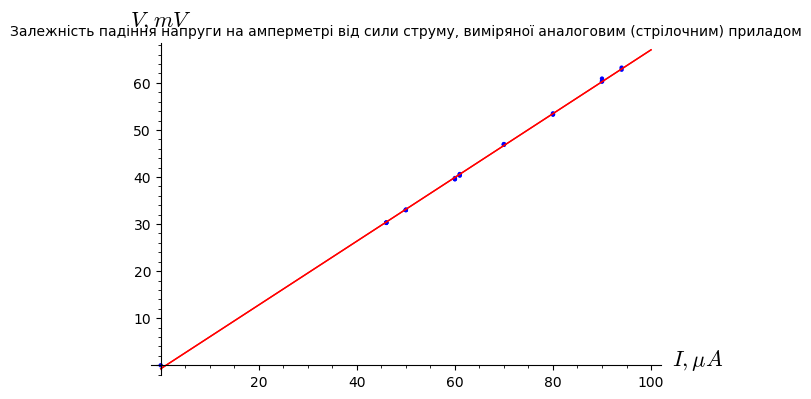

In [31]:
plt_analog_Ampermeter += plot(R_Ampermeter_analog_approximation, iA, 0, 100, color = "red")
plt_analog_Ampermeter.show(axes_labels=['$I, \\mu A$','$V, mV$'],
                          title="Залежність падіння напруги на амперметрі від сили струму, виміряної аналоговим (стрілочним) приладом")

$R_{shunt} = \frac{R_a}{P-1}$

Для наступної роботи з елементом Холла мені потрібно розширити межу вимірювання цього мікроамперметру від 100 микроампер до 10-20 милліампер. Тобто в 100 або в 200 разів. Таким чином мені потрібен шунт 

$R_{shunt} = \frac{R_a}{P-1}$

Для межі вимірювання 20 милліампер потрібен шунт

In [33]:
R_shunt_Ohm = 1000 * R_Ampermeter_analog_kOhm / (200 - 1)
R_shunt_Ohm

3.40442812143942

Для межі вимірювання 100 милліампер потрібен шунт

In [34]:
R_shunt_Ohm = 1000 * R_Ampermeter_analog_kOhm / (1000 - 1)
R_shunt_Ohm

0.678159355521966

В наявності є метрова проволока, закріплена на вимірювальній дошчі, яка використовувалась для побудови моста Керрі Фостера. Для візначення її опору була знята залежність падіння напруги на ній залежно від сили струму за допомогою осцилографа

In [35]:
mA_mV = [
    [51, 22.76],
    [50.8, 22.62],
    [50.4, 22.46],
    [50.2, 22.42],
    [50.0, 22.36],
    
    [25, 11.46],
    [24.9, 11.49],
    [24.8, 11.36],
    [24.8, 11.41],
    [24.7, 11.45],
]

In [36]:
R_1m_wire_Ohm, V_1m_wire = linear_approximation(mA_mV, "\\,\\Omega")

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

nevjazka = 0.0168688498929441
vidhilennja = 0.0432933788791262


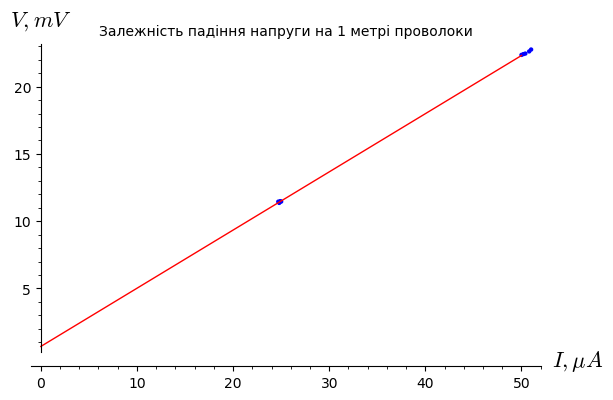

In [38]:
R_1m_wire_approximation = R_1m_wire_Ohm * iA + V_1m_wire

plt_wire = list_plot(mA_mV)
plt_wire += plot(R_1m_wire_approximation, iA, 0, 50, color = "red")
plt_wire.show(axes_labels=['$I, \\mu A$','$V, mV$'],
                            title="Залежність падіння напруги на 1 метрі проволоки")

якщо використовувати наявний метр проволоки в якості шунта, то шунтуючий множник становитиме 

In [39]:
P = 1000 * R_Ampermeter_analog_kOhm / R_1m_wire_Ohm + 1
P

1567.42958623805

Для межі вимірювання 200 милліампер потрібен шунт

In [40]:
R_shunt_Ohm = 1000 * R_Ampermeter_analog_kOhm / (2000 - 1)
R_shunt_Ohm

0.338910053109777

це становить длину наявного дрота в сантиметрах

In [41]:
R_shunt_Ohm / R_1m_wire_Ohm

0.783606596417233

В наявності так ож є 100 метрова ізольованного дроту. Прилад показав 32.2 Ом. Але для уточнення її опору була знята залежність падіння напруги на ній залежно від сили струму за допомогою осцилографа

In [42]:
mA_V = [
    [380, 12.51],
    [380, 12.52],
    [380, 12.51],
    
    [50.9, 1.61],
    [51.6, 1.65],
    [52.0, 1.66],
    
    [65.4, 2.08],
    [65.8, 2.09],
    [66.1, 2.1],
    [66.5, 2.11],
    [66.7, 2.11],
    
    [23.4, 0.667],
    [23.5, 0.66443],
    [23.4, 0.66407],
    
    [12.6, 0.398],
    [12.7, 0.39912],
    [12.6, 0.39917],
    [12.6, 0.3987]
]

In [43]:
R_100m_wire_Ohm, V_100m_wire = linear_approximation(mA_V, "\\,k\\Omega")

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

nevjazka = 0.0177451724081834
vidhilennja = 0.0323084148647007


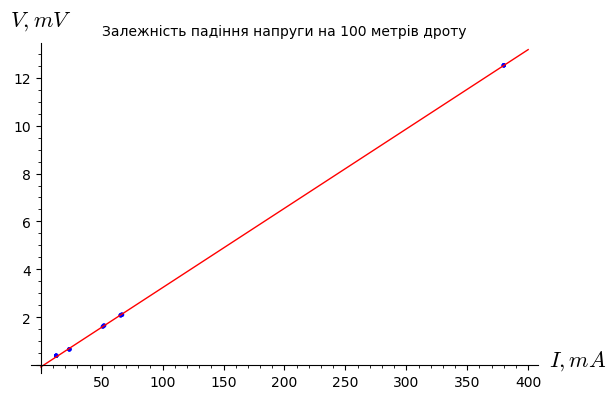

In [51]:
R_100m_wire_approximation = R_100m_wire_Ohm * iA + V_100m_wire

plt_wire = list_plot(mA_V)
plt_wire += plot(R_100m_wire_approximation, iA, 0, 400, color = "red")
plt_wire.show(axes_labels=['$I, m A$','$V, mV$'],
                            title="Залежність падіння напруги на 100 метрів дроту")

Шунтуючий множник $P = \frac{J}{J_a} = \left( \frac{R_a}{R_{shunt}} + 1 \right)$ якщо використати цей дрот в якості шута становитиме

In [63]:
P = R_Ampermeter_analog_kOhm / R_100m_wire_Ohm + 1
P

21.4705506521953

Для межі вимірювання 10 милліампер потрібен шунт

In [49]:
R_shunt_Ohm = 1000 * R_Ampermeter_analog_kOhm / (100 - 1)
R_shunt_Ohm

6.84324440572166

Методом підбору резисторів з 8 наявних резисторів зїєднуючі їх параллельно був виготовлений шунт

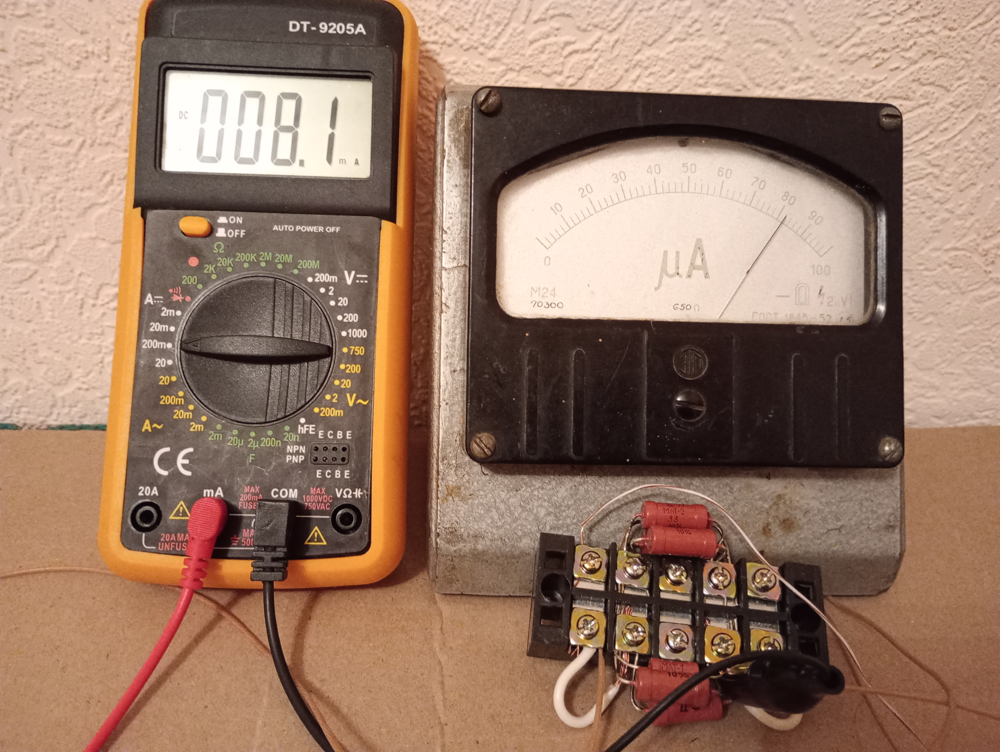

In [58]:
mA_mV_shunt = [
    [0,       0],
    [0.337, 2.3],
    [0.644, 4.4],
]

In [59]:
R_shunt, V_shunt = linear_approximation(mA_mV_shunt, "\\,\\Omega")

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

nevjazka = 4.11209308737170e-6
vidhilennja = 0.00143389209624917


Шунтуючий множник $P = \frac{J}{J_a} = \left( \frac{R_a}{R_{shunt}} + 1 \right)$ для цього шунта становитиме

In [60]:
P = 1000 * R_Ampermeter_analog_kOhm / R_shunt + 1
P

100.160349037994

Таким чином цей шунт можна використовувати в лабораторній работі посвяченій дослідженню еффекту Холла